In [111]:
import os
import re
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
from torch import nn, optim
from torch.nn import functional as F
from torchvision import transforms, datasets
from torch.utils.data import DataLoader
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import torch.optim as optim

# Configuración de dispositivo
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
kwargs = {'num_workers': 1, 'pin_memory': True} if device.type == 'cuda' else {}

# Hiperparámetros
batch_size = 128
latent_size = 128  # Tamaño del vector latente
epochs = 100
# Dimensiones de la imagen
img_width, img_height = 64, 64
feature_size = img_width * img_height * 3  # 64x64x3

In [112]:
import os

directorio_actual = os.getcwd()
print("El directorio actual es:", directorio_actual)

El directorio actual es: c:\Users\Deiby\Desktop\modelos deiby\VIU-TFM


In [113]:



# Perfiles y acciones posibles
perfiles = ['front', 'left', 'right']
ruta_base="../pruebas modelos/Sprites/frames"
acciones = sorted(os.listdir(ruta_base))  # Asegurar consistencia
num_acciones = len(acciones)  # Debe ser 3
num_perfiles = len(perfiles)  # Debe ser 3
num_movimientos = 8  # Movimientos 0-7

# Expresión regular para extraer el perfil y el número de movimiento
patron_nombre = re.compile(r'^(front|left|right)_\d+_(\d+)\.(png|jpg|jpeg)$')

# Dataset
class SpritesDataset(Dataset):
    def __init__(self, image_paths, labels, transform=None):
        self.image_paths = image_paths
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image = Image.open(self.image_paths[idx]).convert("RGB")
        label = torch.tensor(self.labels[idx], dtype=torch.long)  # Convertir a entero
        
        if self.transform:
            image = self.transform(image)
        
        return image, label

# Listar rutas y etiquetas
rutas_imagenes = []
etiquetas = []

for accion_idx, accion in enumerate(acciones):
    ruta_accion = os.path.join(ruta_base, accion)
    
    if os.path.isdir(ruta_accion):
        for archivo in os.listdir(ruta_accion):
            if archivo.endswith(('.png', '.jpg', '.jpeg')):
                match = patron_nombre.match(archivo)
                
                if match:
                    perfil_str, mov_idx = match.groups()[0], int(match.groups()[1])
                    
                    if mov_idx >= num_movimientos:
                        continue  # Si el número de movimiento es inválido, ignorarlo

                    # Obtener índice del perfil
                    perfil_idx = perfiles.index(perfil_str)

                    rutas_imagenes.append(os.path.join(ruta_accion, archivo))

                    # Etiqueta única: acción * 24 + perfil * 8 + movimiento
                    etiqueta = (accion_idx * num_perfiles * num_movimientos) + (perfil_idx * num_movimientos) + mov_idx
                    etiquetas.append(etiqueta)

# Convertir listas a numpy arrays
rutas_imagenes = np.array(rutas_imagenes)
etiquetas = np.array(etiquetas, dtype=np.int64)  # Convertir etiquetas a enteros

# Dividir en entrenamiento y prueba
rutas_train, rutas_test, etiquetas_train, etiquetas_test = train_test_split(
    rutas_imagenes, etiquetas, test_size=0.2, random_state=42
)
# Transformaciones para las imágenes
transform = transforms.Compose([
    transforms.Resize((img_width, img_height)),
    transforms.ToTensor()
])

# Crear datasets y dataloaders
train_dataset = SpritesDataset(rutas_train, etiquetas_train, transform=transform)
test_dataset = SpritesDataset(rutas_test, etiquetas_test, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
# Crear el dataset personalizado
#sprites_dataset = SpritesDataset(rutas_imagenes, etiquetas, transform=transform)
#train_loader = DataLoader(sprites_dataset, batch_size=batch_size, shuffle=True)
# Número total de clases ahora es 72 (3 * 3 * 8)
num_classes = 72  

print(f"Total de imágenes: {len(etiquetas)}")
print(f"Total de clases: {num_classes}")

Total de imágenes: 93312
Total de clases: 72


In [105]:
num_classes = 72  

print(f"Total de imágenes: {len(etiquetas)}")
print(f"Total de clases: {num_classes}")

Total de imágenes: 93312
Total de clases: 72


In [ ]:
# Transformaciones para calcular la media y la desviación estándar
temp_transform = transforms.Compose([
    transforms.Resize((img_width, img_height)),
    transforms.ToTensor()
])

# Crear un DataLoader temporal para calcular la media y la desviación estándar
temp_dataset = SpritesDataset(rutas_train, etiquetas_train, transform=temp_transform)
temp_loader = DataLoader(temp_dataset, batch_size=batch_size, shuffle=False)

# Calcular la media y la desviación estándar
mean = torch.zeros(3)
std = torch.zeros(3)
for images, _ in temp_loader:
    for i in range(3):
        mean[i] += images[:, i, :, :].mean()
        std[i] += images[:, i, :, :].std()
mean /= len(temp_loader.dataset)
std /= len(temp_loader.dataset)

print(f"Media: {mean}, Desviación Estándar: {std}")

# Transformaciones para entrenamiento y prueba (con normalización)
train_transform = transforms.Compose([
    transforms.Resize((img_width, img_height)),
    transforms.ToTensor(),
    transforms.Normalize(mean, std)  # Normalización
])

test_transform = transforms.Compose([
    transforms.Resize((img_width, img_height)),
    transforms.ToTensor(),
    transforms.Normalize(mean, std)  # Normalización
])

# Crear datasets y dataloaders
train_dataset = SpritesDataset(rutas_train, etiquetas_train, transform=train_transform)
test_dataset = SpritesDataset(rutas_test, etiquetas_test, transform=test_transform)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [ ]:

# Transformaciones para las imágenes
transform = transforms.Compose([
    transforms.Resize((img_width, img_height)),
    transforms.ToTensor()
])

# Crear datasets y dataloaders
train_dataset = SpritesDataset(rutas_train, etiquetas_train, transform=transform)
test_dataset = SpritesDataset(rutas_test, etiquetas_test, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
# Crear el dataset personalizado
#sprites_dataset = SpritesDataset(rutas_imagenes, etiquetas, transform=transform)
#train_loader = DataLoader(sprites_dataset, batch_size=batch_size, shuffle=True)
# Número total de clases ahora es 72 (3 * 3 * 8)
num_classes = 72  

print(f"Total de imágenes: {len(etiquetas)}")
print(f"Total de clases: {num_classes}")

## CGAN

In [118]:


# Generador
class Generator(nn.Module):
    def __init__(self, latent_size, num_classes, feature_size):
        super(Generator, self).__init__()
        self.fc1 = nn.Linear(latent_size + num_classes, 256)
        self.fc2 = nn.Linear(256, 512)
        self.fc3 = nn.Linear(512, 1024)
        self.fc4 = nn.Linear(1024, 2048)
        self.fc5 = nn.Linear(2048, 4096)
        self.fc6 = nn.Linear(4096, feature_size)
        self.leaky_relu = nn.LeakyReLU(0.2)
        self.tanh = nn.Tanh()

    def forward(self, z, c):
        inputs = torch.cat([z, c], 1)
        x = self.leaky_relu(self.fc1(inputs))
        x = self.leaky_relu(self.fc2(x))
        x = self.leaky_relu(self.fc3(x))
        x = self.leaky_relu(self.fc4(x))
        x = self.leaky_relu(self.fc5(x))
        x = self.tanh(self.fc6(x))
        return x.view(-1, 3, img_width, img_height)  # Formato de imagen

# Discriminador
class Discriminator(nn.Module):
    def __init__(self, feature_size, num_classes):
        super(Discriminator, self).__init__()
        self.fc1 = nn.Linear(feature_size + num_classes, 4096)
        self.fc2 = nn.Linear(4096, 2048)
        self.fc3 = nn.Linear(2048, 1024)
        self.fc4 = nn.Linear(1024, 512)
        self.fc5 = nn.Linear(512, 256)
        self.fc6 = nn.Linear(256, 1)
        self.leaky_relu = nn.LeakyReLU(0.2)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x, c):
        inputs = torch.cat([x.view(-1, feature_size), c], 1)
        x = self.leaky_relu(self.fc1(inputs))
        x = self.leaky_relu(self.fc2(x))
        x = self.leaky_relu(self.fc3(x))
        x = self.leaky_relu(self.fc4(x))
        x = self.leaky_relu(self.fc5(x))
        x = self.sigmoid(self.fc6(x))
        return x

# Inicializar modelos
generator = Generator(latent_size, num_classes, feature_size).to(device)
discriminator = Discriminator(feature_size, num_classes).to(device)
lr=0.00006

Epoch [0/100], d_loss_train: 0.9770, g_loss_train: 1.6266, d_loss_test: 0.4654, g_loss_test: 2.0122


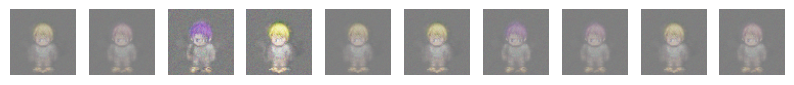

Epoch [1/100], d_loss_train: 0.4798, g_loss_train: 4.2906, d_loss_test: 0.2224, g_loss_test: 2.6636


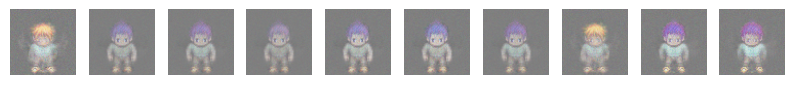

Epoch [2/100], d_loss_train: 0.2950, g_loss_train: 4.6890, d_loss_test: 1.0424, g_loss_test: 5.6512


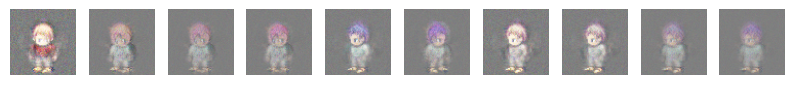

Epoch [3/100], d_loss_train: 0.3207, g_loss_train: 4.3147, d_loss_test: 0.4460, g_loss_test: 1.9895


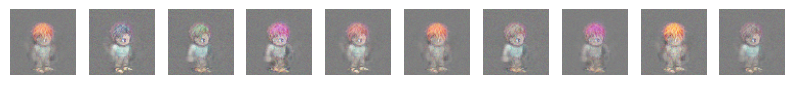

Epoch [4/100], d_loss_train: 0.2280, g_loss_train: 4.6088, d_loss_test: 0.1339, g_loss_test: 3.7804


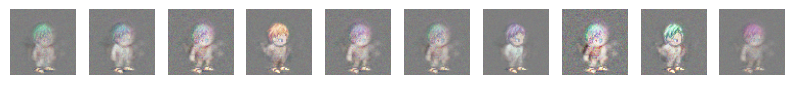

Epoch [5/100], d_loss_train: 0.2209, g_loss_train: 4.7173, d_loss_test: 0.0698, g_loss_test: 4.6052


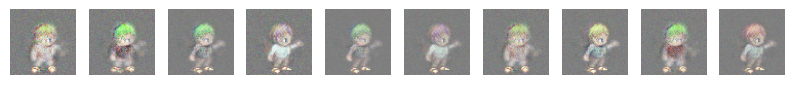

KeyboardInterrupt: 

In [119]:
# Optimizadores
optimizer_G = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
optimizer_D = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

# Función de pérdida
criterion = nn.BCELoss()

# Función para generar one-hot encoding
def one_hot(labels, class_size):
    return F.one_hot(labels, class_size).float().to(device)

lista_g_loss_train = []
lista_d_loss_train = []
lista_g_loss_test = []
lista_d_loss_test = []

# Entrenamiento
for epoch in range(epochs):
    total_d_loss_train = 0
    total_g_loss_train = 0
    total_d_loss_test = 0
    total_g_loss_test = 0

    # Entrenamiento del generador y discriminador con los datos de entrenamiento.
    generator.train()
    discriminator.train()
    for i, (images, labels) in enumerate(train_loader):
        batch_size = images.size(0)
        real_labels = torch.ones(batch_size, 1).to(device)
        fake_labels = torch.zeros(batch_size, 1).to(device)

        images = images.to(device)
        labels = one_hot(labels.to(device),num_classes)

        optimizer_D.zero_grad()
        real_outputs = discriminator(images, labels)
        d_loss_real = criterion(real_outputs, real_labels)

        z = torch.randn(batch_size, latent_size).to(device)
        fake_images = generator(z, labels)
        fake_outputs = discriminator(fake_images.detach(), labels)
        d_loss_fake = criterion(fake_outputs, fake_labels)

        d_loss = d_loss_real + d_loss_fake
        d_loss.backward()
        optimizer_D.step()

        optimizer_G.zero_grad()
        fake_outputs = discriminator(fake_images, labels)
        g_loss = criterion(fake_outputs, real_labels)
        g_loss.backward()
        optimizer_G.step()

        total_d_loss_train += d_loss.item()
        total_g_loss_train += g_loss.item()

    avg_d_loss_train = total_d_loss_train / len(train_loader)
    avg_g_loss_train = total_g_loss_train / len(train_loader)

    lista_d_loss_train.append(avg_d_loss_train)
    lista_g_loss_train.append(avg_g_loss_train)

    # Evaluación en el conjunto de prueba
    generator.eval()
    discriminator.eval()
    with torch.no_grad():
        for images, labels in test_loader:
            batch_size = images.size(0)
            real_labels = torch.ones(batch_size, 1).to(device)
            fake_labels = torch.zeros(batch_size, 1).to(device)

            images = images.to(device)
            labels = one_hot(labels.to(device),num_classes)

            real_outputs = discriminator(images, labels)
            d_loss_real = criterion(real_outputs, real_labels)

            z = torch.randn(batch_size, latent_size).to(device)
            fake_images = generator(z, labels)
            fake_outputs = discriminator(fake_images, labels)
            d_loss_fake = criterion(fake_outputs, fake_labels)

            d_loss = d_loss_real + d_loss_fake
            g_loss = criterion(fake_outputs, real_labels)

            total_d_loss_test += d_loss.item()
            total_g_loss_test += g_loss.item()

    avg_d_loss_test = total_d_loss_test / len(test_loader)
    avg_g_loss_test = total_g_loss_test / len(test_loader)

    lista_d_loss_test.append(avg_d_loss_test)
    lista_g_loss_test.append(avg_g_loss_test)

    print(f"Epoch [{epoch}/{epochs}], d_loss_train: {avg_d_loss_train:.4f}, g_loss_train: {avg_g_loss_train:.4f}, d_loss_test: {avg_d_loss_test:.4f}, g_loss_test: {avg_g_loss_test:.4f}")

    # Generar imágenes de muestra después de cada época
    with torch.no_grad():
        z = torch.randn(10, latent_size).to(device)
        c = torch.arange(10).to(device)
        label_use=one_hot(c,num_classes)
        sample_images = generator(z, label_use).cpu()
        fig, axes = plt.subplots(1, 10, figsize=(10, 1))
        for j in range(10):
            axes[j].imshow(sample_images[j].permute(1, 2, 0).numpy() * 0.5 + 0.5)
            axes[j].axis("off")
        plt.show()

Epoch [0/50], Step [728/729], d_loss: 1.6679, g_loss: 1.0048


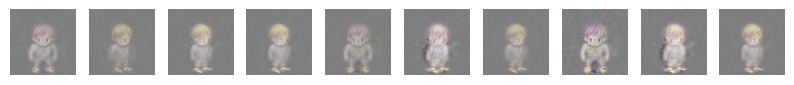

Epoch [1/50], Step [728/729], d_loss: 3.5846, g_loss: 0.4828


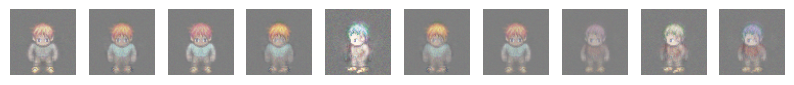

Epoch [2/50], Step [728/729], d_loss: 3.9084, g_loss: 0.3581


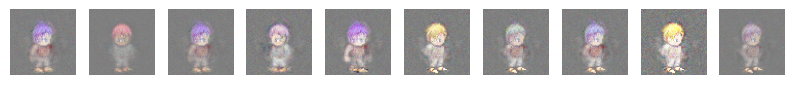

Epoch [3/50], Step [728/729], d_loss: 4.7149, g_loss: 0.2248


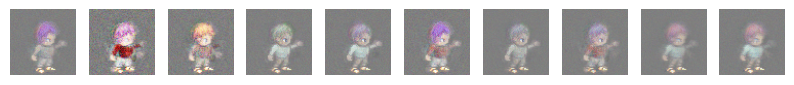

Epoch [4/50], Step [728/729], d_loss: 4.6000, g_loss: 0.2289


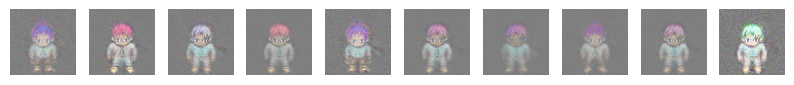

Epoch [5/50], Step [728/729], d_loss: 5.0237, g_loss: 0.1748


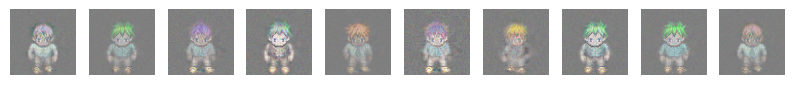

Epoch [6/50], Step [728/729], d_loss: 5.0660, g_loss: 0.2298


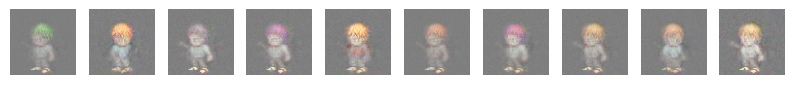

Epoch [7/50], Step [728/729], d_loss: 5.0178, g_loss: 0.1978


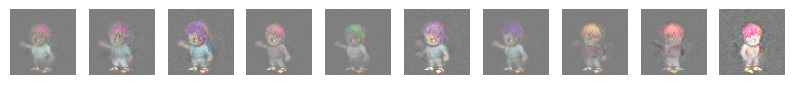

Epoch [8/50], Step [728/729], d_loss: 5.7271, g_loss: 0.1478


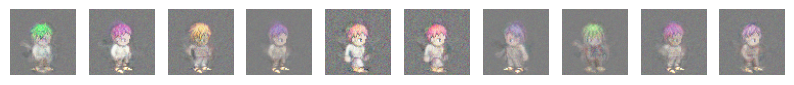

Epoch [9/50], Step [728/729], d_loss: 5.6546, g_loss: 0.1418


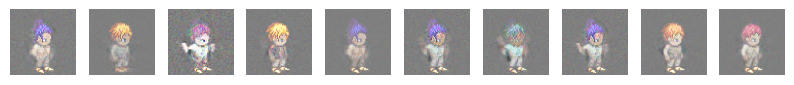

Epoch [10/50], Step [728/729], d_loss: 6.4356, g_loss: 0.1107


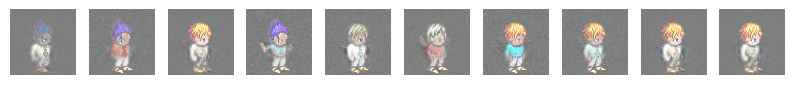

Epoch [11/50], Step [728/729], d_loss: 5.9192, g_loss: 0.2089


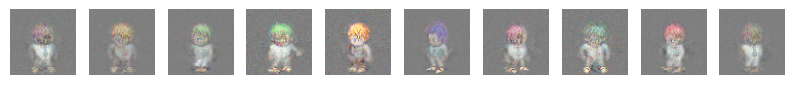

Epoch [12/50], Step [728/729], d_loss: 5.3946, g_loss: 0.1671


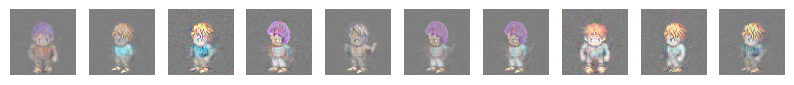

Epoch [13/50], Step [728/729], d_loss: 5.9384, g_loss: 0.1546


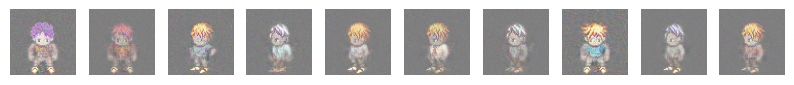

Epoch [14/50], Step [728/729], d_loss: 5.6064, g_loss: 0.1482


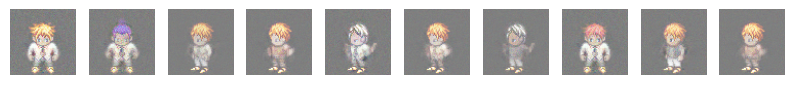

Epoch [15/50], Step [728/729], d_loss: 5.8544, g_loss: 0.1280


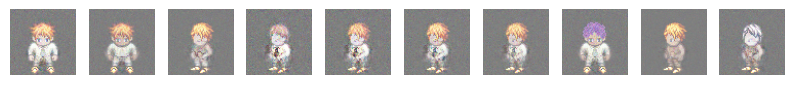

Epoch [16/50], Step [728/729], d_loss: 6.0375, g_loss: 0.1388


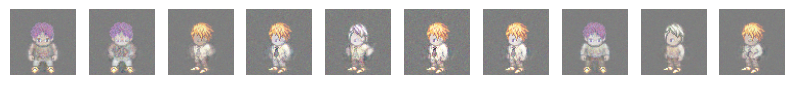

Epoch [17/50], Step [728/729], d_loss: 6.4170, g_loss: 0.1352


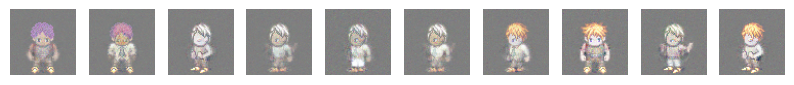

Epoch [18/50], Step [728/729], d_loss: 6.6292, g_loss: 0.1247


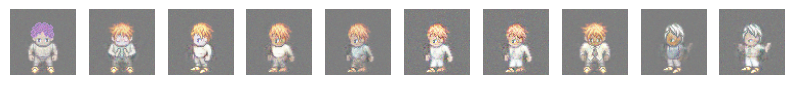

Epoch [19/50], Step [728/729], d_loss: 6.7578, g_loss: 0.1232


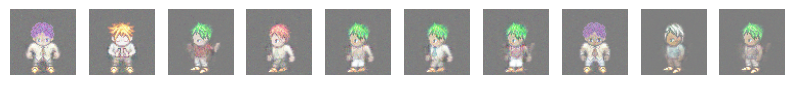

Epoch [20/50], Step [728/729], d_loss: 7.0348, g_loss: 0.1109


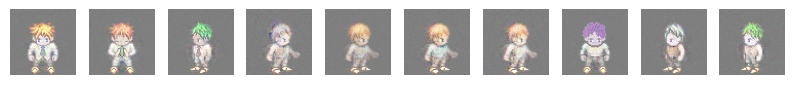

Epoch [21/50], Step [728/729], d_loss: 4.6963, g_loss: 0.3746


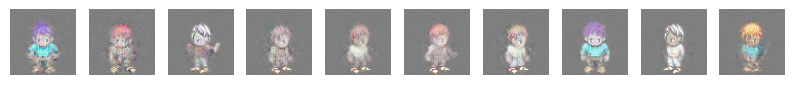

Epoch [22/50], Step [728/729], d_loss: 5.2673, g_loss: 0.1799


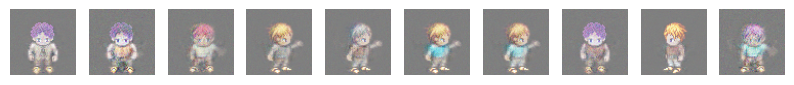

Epoch [23/50], Step [728/729], d_loss: 5.6425, g_loss: 0.1378


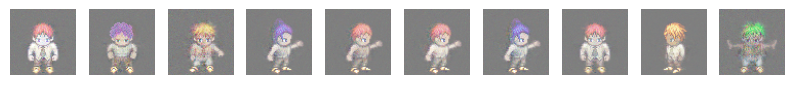

Epoch [24/50], Step [728/729], d_loss: 6.1695, g_loss: 0.1304


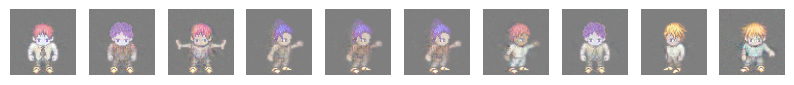

Epoch [25/50], Step [728/729], d_loss: 6.1723, g_loss: 0.1518


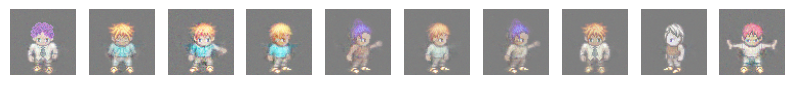

Epoch [26/50], Step [728/729], d_loss: 6.6374, g_loss: 0.1189


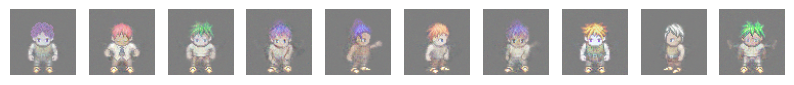

Epoch [27/50], Step [728/729], d_loss: 6.6045, g_loss: 0.1259


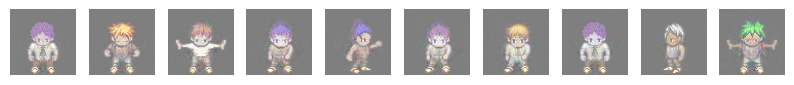

Epoch [28/50], Step [728/729], d_loss: 6.9171, g_loss: 0.1291


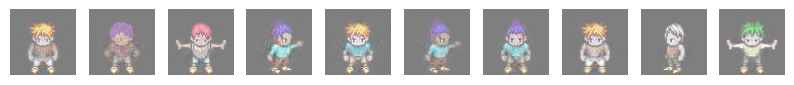

Epoch [29/50], Step [728/729], d_loss: 7.4039, g_loss: 0.1092


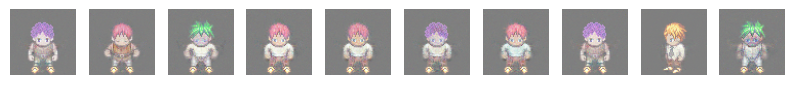

Epoch [30/50], Step [728/729], d_loss: 7.5037, g_loss: 0.1065


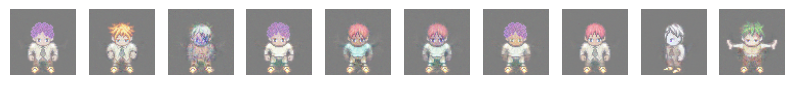

Epoch [31/50], Step [728/729], d_loss: 6.6574, g_loss: 0.1453


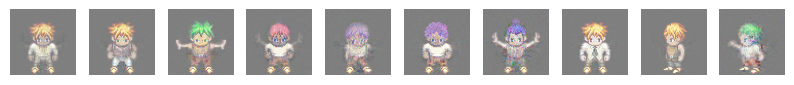

Epoch [32/50], Step [728/729], d_loss: 7.5005, g_loss: 0.1041


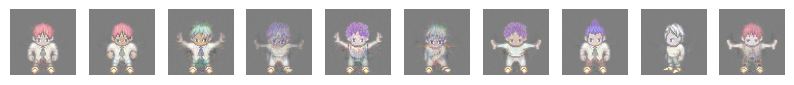

Epoch [33/50], Step [728/729], d_loss: 7.5393, g_loss: 0.1106


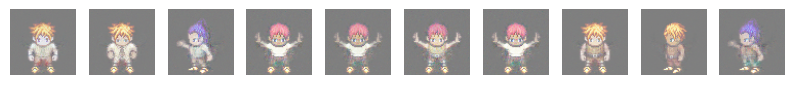

Epoch [34/50], Step [728/729], d_loss: 7.7519, g_loss: 0.0983


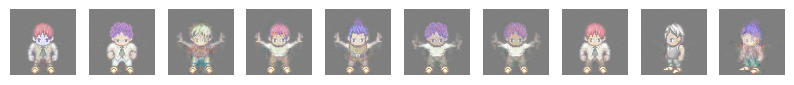

Epoch [35/50], Step [728/729], d_loss: 6.4416, g_loss: 0.1665


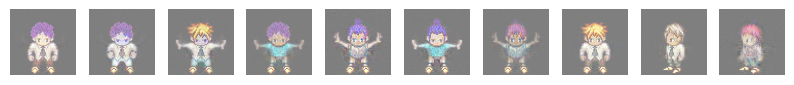

Epoch [36/50], Step [728/729], d_loss: 7.6596, g_loss: 0.0867


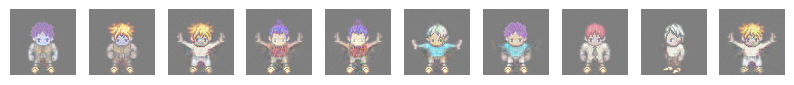

Epoch [37/50], Step [728/729], d_loss: 7.7865, g_loss: 0.0955


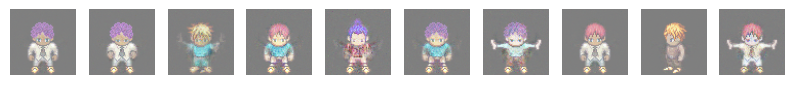

Epoch [38/50], Step [728/729], d_loss: 7.8979, g_loss: 0.0935


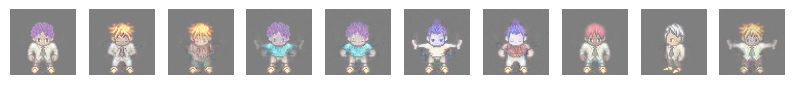

Epoch [39/50], Step [728/729], d_loss: 8.0724, g_loss: 0.0859


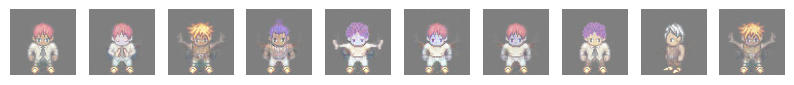

Epoch [40/50], Step [728/729], d_loss: 8.0516, g_loss: 0.0940


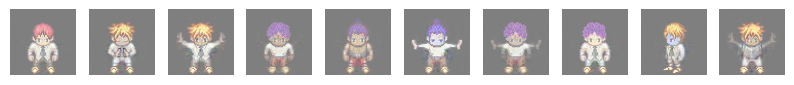

Epoch [41/50], Step [728/729], d_loss: 8.0305, g_loss: 0.0938


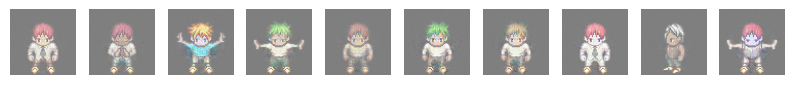

Epoch [42/50], Step [728/729], d_loss: 8.2267, g_loss: 0.0924


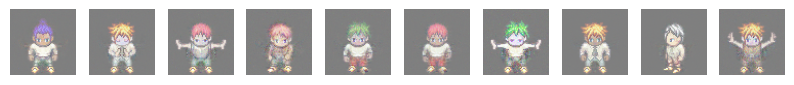

Epoch [43/50], Step [728/729], d_loss: 8.2100, g_loss: 0.0985


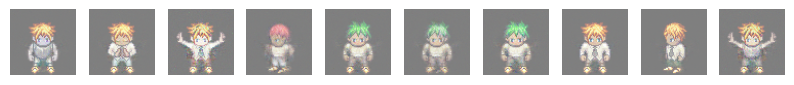

Epoch [44/50], Step [728/729], d_loss: 7.1519, g_loss: 0.1293


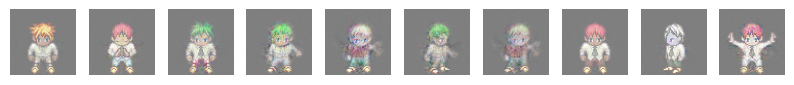

Epoch [45/50], Step [728/729], d_loss: 8.0503, g_loss: 0.0978


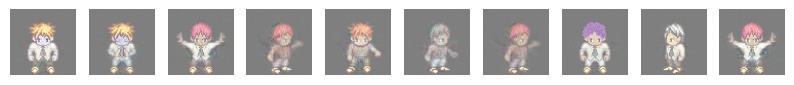

Epoch [46/50], Step [728/729], d_loss: 7.7800, g_loss: 0.1034


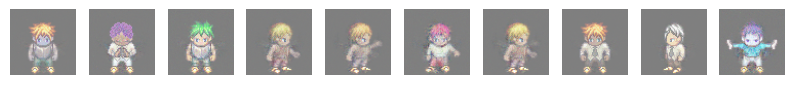

Epoch [47/50], Step [728/729], d_loss: 7.8366, g_loss: 0.1012


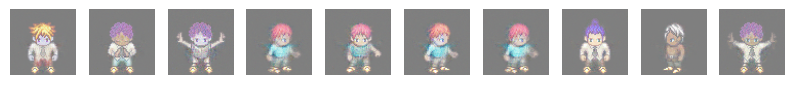

Epoch [48/50], Step [728/729], d_loss: 8.0430, g_loss: 0.1022


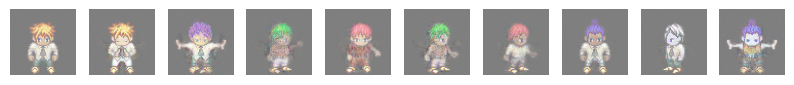

Epoch [49/50], Step [728/729], d_loss: 8.2719, g_loss: 0.1023


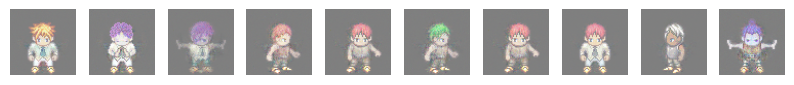

In [ ]:
#antiguo

#funcional lr=0.000055 
lr=0.00008
# Optimizadores
optimizer_G = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
optimizer_D = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

# Función de pérdida
criterion = nn.BCELoss()

# Función para generar one-hot encoding
def one_hot(labels, class_size):
    return F.one_hot(labels, class_size).float().to(device)

lista_g_loss=[]
lista_d_loss=[]
# Entrenamiento
for epoch in range(epochs):
    total_d_loss=0
    total_g_loss=0
    for i, (images, labels) in enumerate(train_loader):
        batch_size = images.size(0)
        real_labels = torch.ones(batch_size, 1).to(device)
        fake_labels = torch.zeros(batch_size, 1).to(device)

        # Convertir imágenes y etiquetas a dispositivo
        images = images.to(device)
        labels = one_hot(labels, num_classes)

        # Entrenar el discriminador con imágenes reales
        optimizer_D.zero_grad()
        real_outputs = discriminator(images, labels)
        d_loss_real = criterion(real_outputs, real_labels)

        # Entrenar el discriminador con imágenes falsas
        z = torch.randn(batch_size, latent_size).to(device)
        fake_images = generator(z, labels)
        fake_outputs = discriminator(fake_images.detach(), labels)
        d_loss_fake = criterion(fake_outputs, fake_labels)

        # Pérdida total del discriminador
        d_loss = d_loss_real + d_loss_fake
        d_loss.backward()
        optimizer_D.step()

        # Entrenar el generador
        optimizer_G.zero_grad()
        fake_outputs = discriminator(fake_images, labels)
        g_loss = criterion(fake_outputs, real_labels)
        g_loss.backward()
        optimizer_G.step()
        total_d_loss+=d_loss.item()
        total_g_loss+=g_loss.item()
    
    avg_gloss=total_d_loss/len(train_loader)
    avg_dloss=total_g_loss/len(train_loader)

    print(f"Epoch [{epoch}/{epochs}], Step [{i}/{len(train_loader)}], "
                  f"d_loss: {avg_dloss:.4f}, g_loss: {avg_gloss:.4f}")
    lista_d_loss.append(avg_dloss)
    lista_g_loss.append(avg_gloss)
    # Generar imágenes de muestra después de cada época
    with torch.no_grad():
        z = torch.randn(10, latent_size).to(device)
        c = torch.eye(num_classes, num_classes).to(device)[:10]
        sample_images = generator(z, c).cpu()
        fig, axes = plt.subplots(1, 10, figsize=(10, 1))
        for j in range(10):
            axes[j].imshow(sample_images[j].permute(1, 2, 0).numpy() * 0.5 + 0.5)  # Desnormalizar
            axes[j].axis("off")
        plt.show()

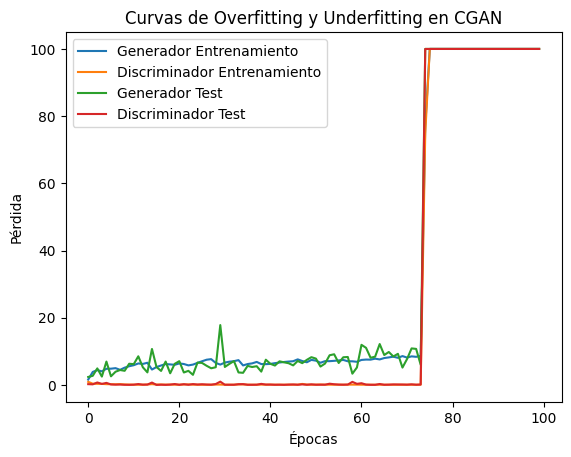

In [116]:
# Graficar pérdidas

epochs_range = range(0, len(lista_g_loss_train))
plt.plot(epochs_range, lista_g_loss_train, label="Generador Entrenamiento")
plt.plot(epochs_range, lista_d_loss_train, label="Discriminador Entrenamiento")
plt.plot(epochs_range, lista_g_loss_test, label="Generador Test")
plt.plot(epochs_range, lista_d_loss_test, label="Discriminador Test")
plt.xlabel("Épocas")
plt.ylabel("Pérdida")
plt.legend()
plt.title("Curvas de Overfitting y Underfitting en CGAN")
plt.show()

In [100]:
import time
import torch.cuda as cuda
def sample_noise(batch_size, latent_dim):
    return torch.randn(batch_size, latent_dim, device=device)

def generate_images_CGAN(model, num_samples=5, accion=None, perfil=None, movimiento=None):
    # Medir uso inicial de recursos
    start_time = time.time()

    with torch.no_grad():
        # Crear ruido aleatorio
        test_noise = sample_noise(num_samples, latent_size)

        # Crear etiquetas condicionales
        if not None in [accion, perfil, movimiento]:
            perfil_grupo = ['front', 'left', 'right']
            accion_grupo = ['slash', 'spellcard', 'walk']
            perfiln = perfil_grupo.index(perfil)
            accionn = accion_grupo.index(accion)
            clases_list = [(accionn * 3 * 8) + (perfiln * 8) + movimiento for _ in range(num_samples)]
            clases = torch.tensor(clases_list, dtype=torch.long).to(device)
        else:
            clases = torch.randint(0, num_classes, (num_samples,), device=device)
        
        c = torch.zeros(num_samples, num_classes)
        c[range(num_samples), clases] = 1
        c = c.to(device)

        print(clases)
        generated_images = model(test_noise, c).cpu()  # Pasar el one-hot encoding al generador
    if device.type == 'cuda':
        vram_usage = cuda.memory_allocated(device) / (1024 ** 2)  # MB
        print(f"Consumo de VRAM: {vram_usage:.2f} MB")
    
    ram_usage = torch.cuda.memory_reserved(device) / (1024 ** 2)  # MB
    print(f"Consumo de RAM: {ram_usage:.2f} MB")
    # Medir uso final de recursos
    end_time = time.time()
    # Calcular métricas
    execution_time = (end_time - start_time) / num_samples

    print(f"Tiempo promedio por imagen: {execution_time:.4f} segundos")

    # Mostrar las imágenes con la clase
    fig, axes = plt.subplots(1, num_samples, figsize=(num_samples * 2, 2))
    for i in range(num_samples):
        img = generated_images[i].permute(1, 2, 0).numpy()  # Reordenar ejes
        img = (img - img.min()) / (img.max() - img.min())  # Normalizar a [0,1]
        axes[i].imshow(img)
        axes[i].axis('off')

    plt.show()

tensor([14, 11,  7, 27, 31], device='cuda:0')
Consumo de VRAM: 1912.38 MB
Consumo de RAM: 3546.00 MB
Tiempo promedio por imagen: 0.0128 segundos


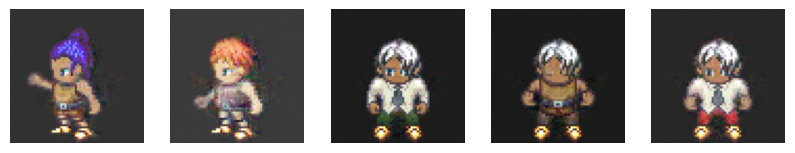

tensor([5, 5, 5, 5, 5], device='cuda:0')
Consumo de VRAM: 1912.38 MB
Consumo de RAM: 3546.00 MB
Tiempo promedio por imagen: 0.0070 segundos


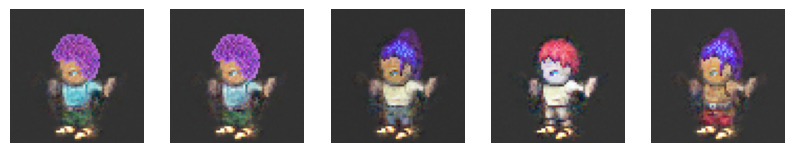

tensor([21, 21, 21, 21, 21], device='cuda:0')
Consumo de VRAM: 1912.38 MB
Consumo de RAM: 3546.00 MB
Tiempo promedio por imagen: 0.0067 segundos


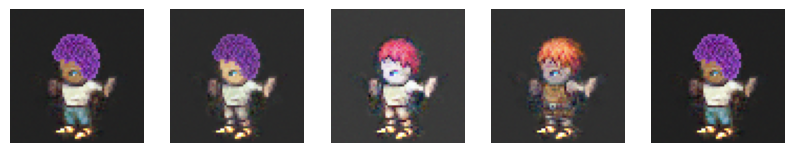

tensor([13, 13, 13, 13, 13], device='cuda:0')
Consumo de VRAM: 1912.38 MB
Consumo de RAM: 3546.00 MB
Tiempo promedio por imagen: 0.0066 segundos


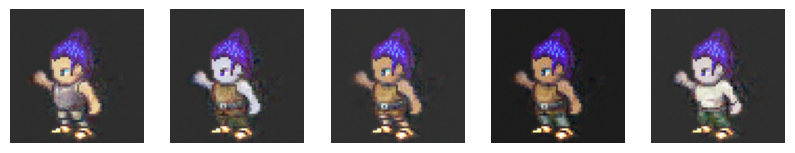

tensor([29, 29, 29, 29, 29], device='cuda:0')
Consumo de VRAM: 1912.38 MB
Consumo de RAM: 3546.00 MB
Tiempo promedio por imagen: 0.0067 segundos


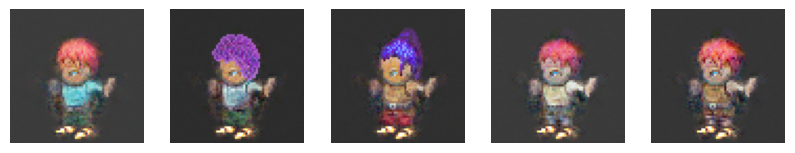

tensor([45, 45, 45, 45, 45], device='cuda:0')
Consumo de VRAM: 1912.38 MB
Consumo de RAM: 3546.00 MB
Tiempo promedio por imagen: 0.0064 segundos


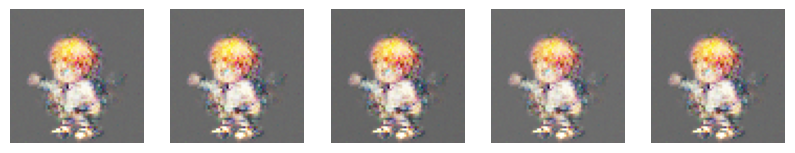

tensor([37, 37, 37, 37, 37], device='cuda:0')
Consumo de VRAM: 1912.38 MB
Consumo de RAM: 3546.00 MB
Tiempo promedio por imagen: 0.0068 segundos


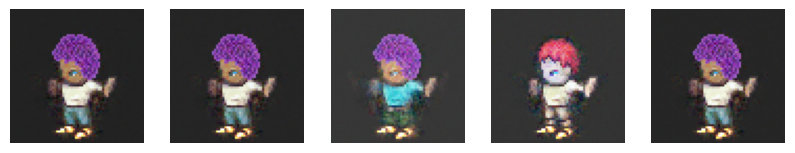

tensor([53, 53, 53, 53, 53], device='cuda:0')
Consumo de VRAM: 1912.38 MB
Consumo de RAM: 3546.00 MB
Tiempo promedio por imagen: 0.0078 segundos


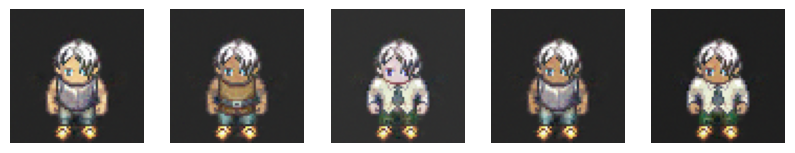

tensor([69, 69, 69, 69, 69], device='cuda:0')
Consumo de VRAM: 1912.38 MB
Consumo de RAM: 3546.00 MB
Tiempo promedio por imagen: 0.0075 segundos


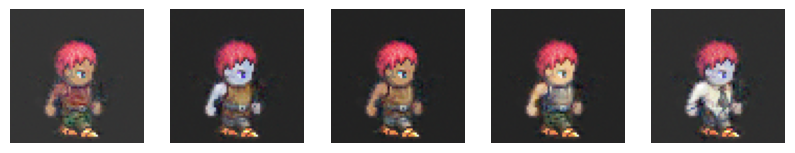

tensor([61, 61, 61, 61, 61], device='cuda:0')
Consumo de VRAM: 1912.38 MB
Consumo de RAM: 3546.00 MB
Tiempo promedio por imagen: 0.0067 segundos


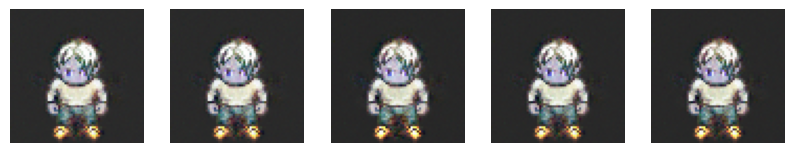

In [101]:
# Llamar a la función para generar imágenes
generate_images_CGAN(generator, num_samples=5)
generate_images_CGAN(generator, num_samples=5,perfil='front',accion='slash',movimiento=5)
generate_images_CGAN(generator, num_samples=5,perfil='right',accion='slash',movimiento=5)
generate_images_CGAN(generator, num_samples=5,perfil='left',accion='slash',movimiento=5)
generate_images_CGAN(generator, num_samples=5,perfil='front',accion='spellcard',movimiento=5)
generate_images_CGAN(generator, num_samples=5,perfil='right',accion='spellcard',movimiento=5)
generate_images_CGAN(generator, num_samples=5,perfil='left',accion='spellcard',movimiento=5)
generate_images_CGAN(generator, num_samples=5,perfil='front',accion='walk',movimiento=5)
generate_images_CGAN(generator, num_samples=5,perfil='right',accion='walk',movimiento=5)
generate_images_CGAN(generator, num_samples=5,perfil='left',accion='walk',movimiento=5)

creando figuras para 72


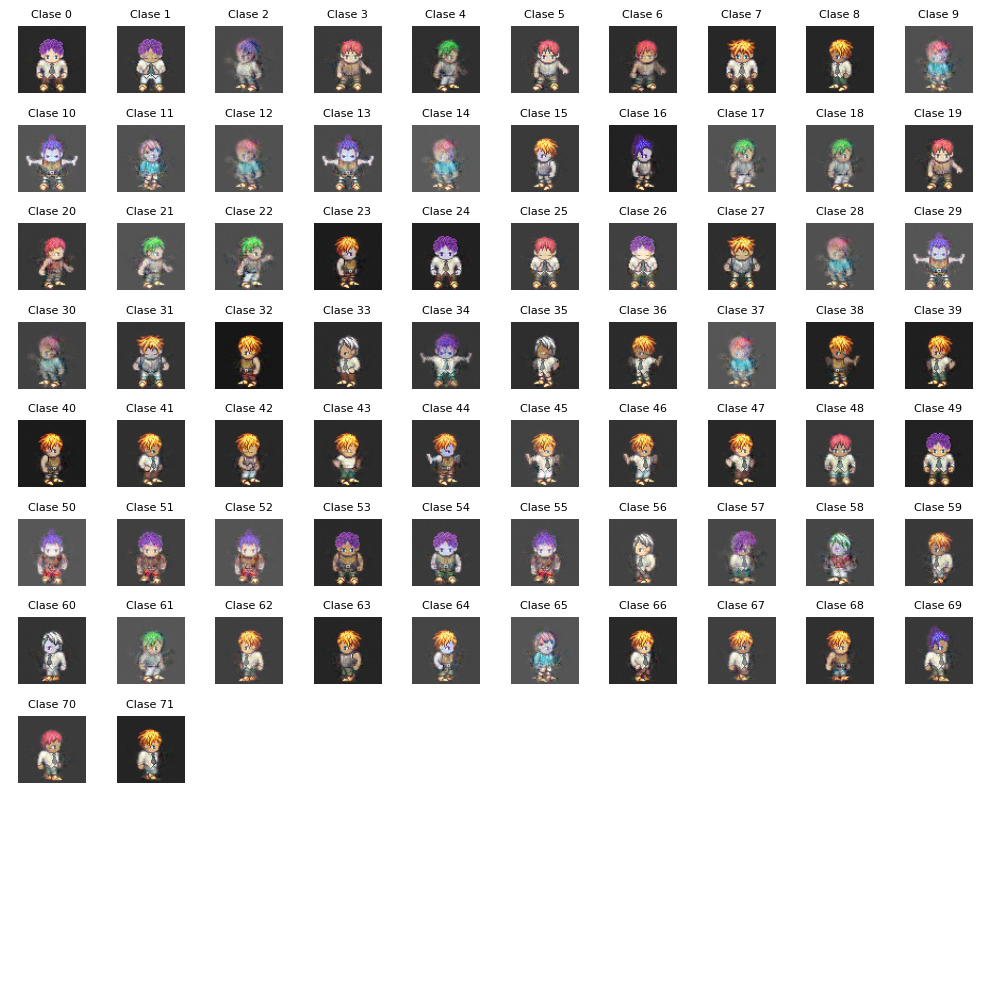

In [85]:
import matplotlib.pyplot as plt
import torch

def generate_images_for_all_classes(model, latent_size, num_classes, img_width, img_height):
    """
    Genera una imagen para cada clase y las muestra en una cuadrícula.
    
    Args:
        model (nn.Module): El generador del CGAN.
        latent_size (int): Dimensión del vector latente.
        num_classes (int): Número total de clases.
        img_width (int): Ancho de las imágenes generadas.
        img_height (int): Alto de las imágenes generadas.
    """
    model.eval()  # Poner el modelo en modo evaluación
    with torch.no_grad():
        # Crear un tensor de ruido fijo para todas las clases
        noise = torch.randn(num_classes, latent_size).to(device)
        
        # Crear un tensor de etiquetas one-hot para todas las clases
        labels = torch.eye(num_classes).to(device)  # One-hot encoding para todas las clases
        
        # Generar imágenes para todas las clases
        generated_images = model(noise, labels).cpu()
        
        # Mostrar las imágenes en una cuadrícula
        fig, axes = plt.subplots(
            nrows=int(num_classes**0.55),  # Número de filas
            ncols=int(num_classes**0.55),  # Número de columnas
            figsize=(10, 10)  # Tamaño de la figura
        )
        print("creando figuras para %s"%num_classes)
        for i, ax in enumerate(axes.flat):
            if i < num_classes:
                img = generated_images[i].permute(1, 2, 0).numpy()  # Reordenar ejes
                img = (img - img.min()) / (img.max() - img.min())  # Normalizar a [0,1]
                ax.imshow(img)
                ax.set_title(f"Clase {i}", fontsize=8)
            ax.axis('off')  # Ocultar ejes
        
        plt.tight_layout()
        plt.show()

# Llamar a la función para generar imágenes para todas las clases
generate_images_for_all_classes(generator, latent_size, num_classes, img_width, img_height)

In [ ]:
#guardar modelo
generator = Generator(latent_size, num_classes, feature_size).to(device)
discriminator = Discriminator(feature_size, num_classes).to(device)

import torch

# Asumiendo que 'model' es tu modelo entrenado
PATH = "modelos guardados/generator_state_dicts.pth" # Nombre del archivo a guardar
torch.save(generator.state_dict(), PATH)

# Asumiendo que 'model' es tu modelo entrenado
PATH = "modelos guardados/discriminator_state_dicts.pth" # Nombre del archivo a guardar
torch.save(discriminator.state_dict(), PATH)

PATH = "modelos guardados/generator_completo.pth"
torch.save(generator, PATH)

PATH = "modelos guardados/discriminator_completo.pth"
torch.save(discriminator, PATH)




## DCGAN

In [156]:
# Hiperparámetros
latent_size = 100  # Tamaño del vector latente
num_classes = 72   # Número de clases (3 acciones * 3 perfiles * 8 movimientos)
img_channels = 3   # Canales de la imagen (RGB)
img_size = 64      # Tamaño de la imagen (64x64)
batch_size = 32



# Generador (DCGAN)
class GeneratorDCGAN(nn.Module):
    def __init__(self, latent_size, num_classes, img_channels):
        super(GeneratorDCGAN, self).__init__()
        self.latent_size = latent_size
        self.num_classes = num_classes

        # Capas convolucionales transpuestas
        self.main = nn.Sequential(
            # Entrada: (latent_size + num_classes) x 1 x 1
            nn.ConvTranspose2d(latent_size + num_classes, 512, kernel_size=4, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(True),
            # Salida: 512 x 4 x 4

            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            # Salida: 256 x 8 x 8

            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            # Salida: 128 x 16 x 16

            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            # Salida: 64 x 32 x 32

            nn.ConvTranspose2d(64, img_channels, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh()
            # Salida: img_channels x 64 x 64
        )

    def forward(self, z, c):
        # Concatenar el vector latente con la etiqueta condicional
        c = c.view(-1, self.num_classes, 1, 1)  # Cambiar forma para concatenar
        z = z.view(-1, self.latent_size, 1, 1)  # Cambiar forma para concatenar
        inputs = torch.cat([z, c], dim=1)  # Concatenar en la dimensión del canal
        return self.main(inputs)

# Discriminador (DCGAN)
class DiscriminatorDCGAN(nn.Module):
    def __init__(self, img_channels, num_classes):
        super(DiscriminatorDCGAN, self).__init__()
        self.img_channels = img_channels
        self.num_classes = num_classes

        # Capas convolucionales
        self.main = nn.Sequential(
            # Entrada: (img_channels + num_classes) x 64 x 64
            nn.Conv2d(img_channels + num_classes, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # Salida: 64 x 32 x 32

            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            # Salida: 128 x 16 x 16

            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            # Salida: 256 x 8 x 8

            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            # Salida: 512 x 4 x 4

            nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
            nn.Sigmoid()
            # Salida: 1 x 1 x 1
        )

    def forward(self, x, c):
        # Concatenar la imagen con la etiqueta condicional
        c = c.view(-1, self.num_classes, 1, 1)  # Cambiar forma para concatenar
        c = c.expand(-1, self.num_classes, x.size(2), x.size(3))  # Expandir a la forma de la imagen
        inputs = torch.cat([x, c], dim=1)  # Concatenar en la dimensión del canal
        return self.main(inputs)

# Inicializar modelos
generatorDCGAN = GeneratorDCGAN(latent_size, num_classes, img_channels).to(device)
discriminatorDCGAN = DiscriminatorDCGAN(img_channels, num_classes).to(device)


# Función de pérdida
criterionDCGAN = nn.BCELoss()

# Función para generar one-hot encoding
def one_hot(labels, class_size):
    return F.one_hot(labels, class_size).float().to(device)
lr=0.00001
epochs = 50
# Optimizadores
optimizer_G = optim.Adam(generatorDCGAN.parameters(), lr=lr, betas=(0.5, 0.999))
optimizer_D = optim.Adam(discriminatorDCGAN.parameters(), lr=lr, betas=(0.5, 0.999))



Epoch [0/50], Step [2915/2916], d_loss: 4.4498, g_loss: 0.0740


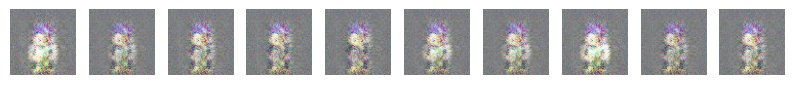

Epoch [1/50], Step [2915/2916], d_loss: 5.6133, g_loss: 0.0274


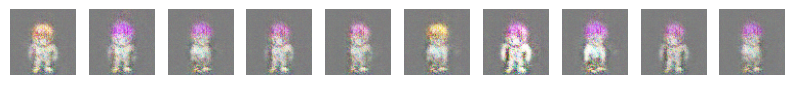

Epoch [2/50], Step [2915/2916], d_loss: 5.4945, g_loss: 0.0339


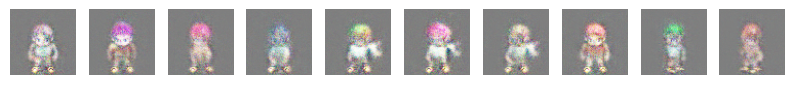

Epoch [3/50], Step [2915/2916], d_loss: 4.9305, g_loss: 0.0440


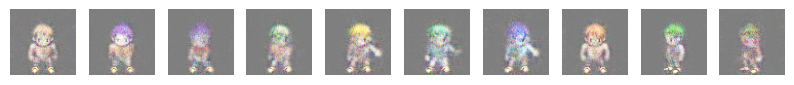

Epoch [4/50], Step [2915/2916], d_loss: 4.6571, g_loss: 0.0519


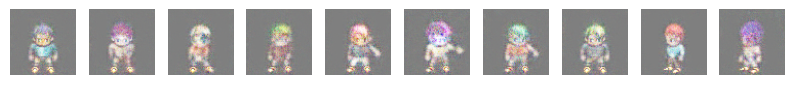

Epoch [5/50], Step [2915/2916], d_loss: 4.7288, g_loss: 0.0459


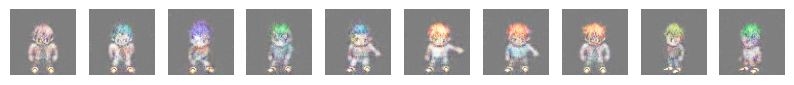

Epoch [6/50], Step [2915/2916], d_loss: 5.0009, g_loss: 0.0491


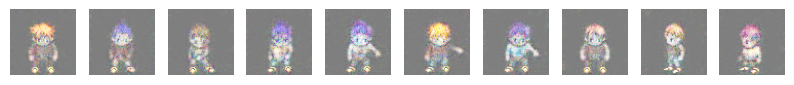

Epoch [7/50], Step [2915/2916], d_loss: 5.0314, g_loss: 0.0352


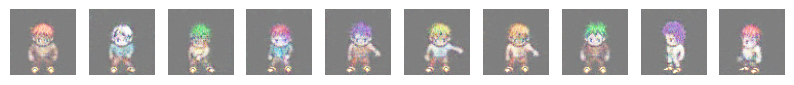

Epoch [8/50], Step [2915/2916], d_loss: 5.2038, g_loss: 0.0430


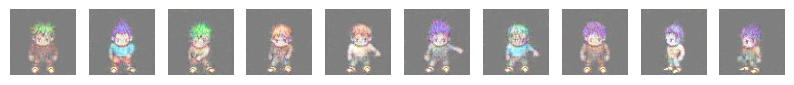

Epoch [9/50], Step [2915/2916], d_loss: 5.3901, g_loss: 0.0358


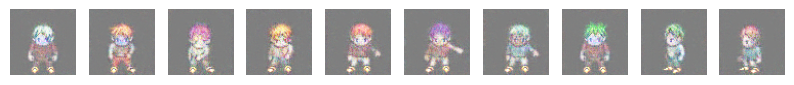

Epoch [10/50], Step [2915/2916], d_loss: 5.4408, g_loss: 0.0387


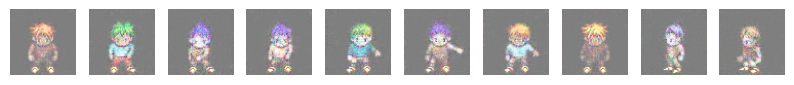

Epoch [11/50], Step [2915/2916], d_loss: 5.5031, g_loss: 0.0437


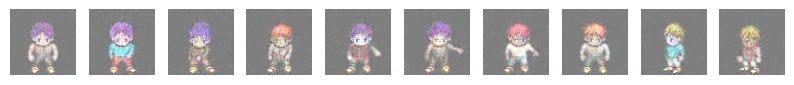

Epoch [12/50], Step [2915/2916], d_loss: 5.4407, g_loss: 0.0368


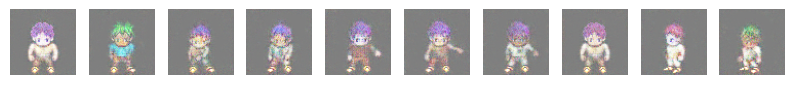

Epoch [13/50], Step [2915/2916], d_loss: 5.4749, g_loss: 0.0440


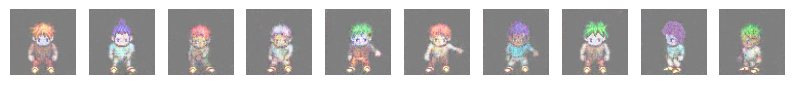

Epoch [14/50], Step [2915/2916], d_loss: 5.4437, g_loss: 0.0432


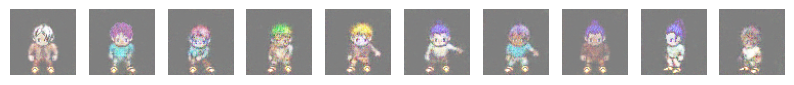

Epoch [15/50], Step [2915/2916], d_loss: 5.5138, g_loss: 0.0545


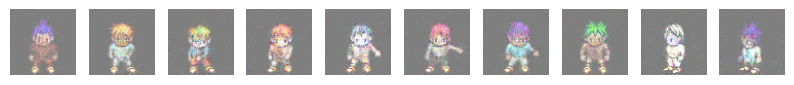

Epoch [16/50], Step [2915/2916], d_loss: 5.7616, g_loss: 0.0294


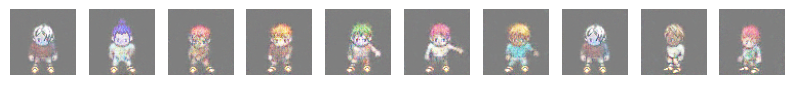

Epoch [17/50], Step [2915/2916], d_loss: 5.8823, g_loss: 0.0371


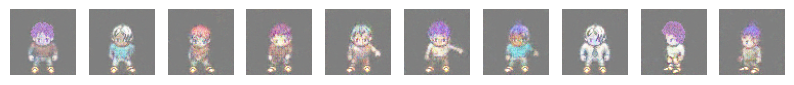

Epoch [18/50], Step [2915/2916], d_loss: 5.9438, g_loss: 0.0327


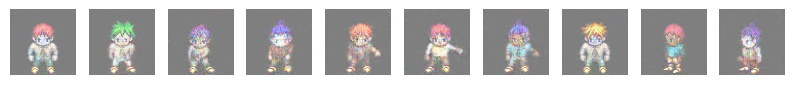

Epoch [19/50], Step [2915/2916], d_loss: 5.9680, g_loss: 0.0403


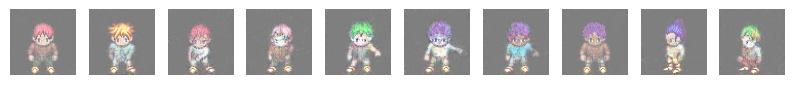

Epoch [20/50], Step [2915/2916], d_loss: 6.1841, g_loss: 0.0243


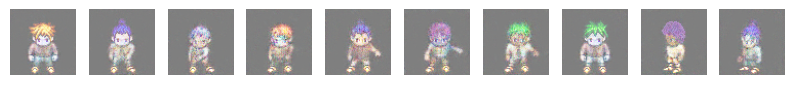

Epoch [21/50], Step [2915/2916], d_loss: 6.1816, g_loss: 0.0347


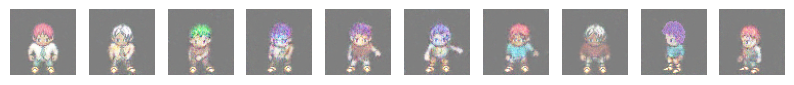

Epoch [22/50], Step [2915/2916], d_loss: 6.2510, g_loss: 0.0316


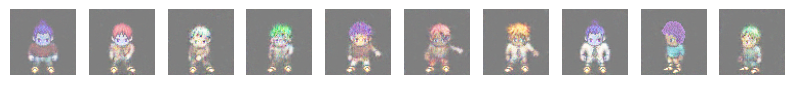

Epoch [23/50], Step [2915/2916], d_loss: 6.3605, g_loss: 0.0281


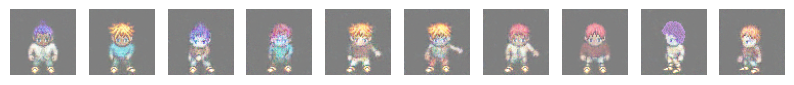

Epoch [24/50], Step [2915/2916], d_loss: 6.4603, g_loss: 0.0267


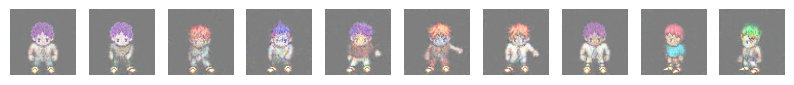

Epoch [25/50], Step [2915/2916], d_loss: 6.5978, g_loss: 0.0230


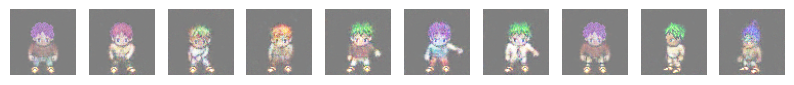

Epoch [26/50], Step [2915/2916], d_loss: 6.5102, g_loss: 0.0333


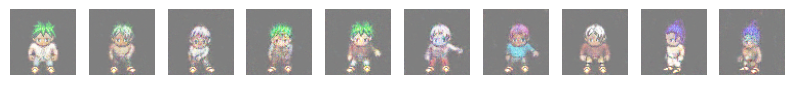

Epoch [27/50], Step [2915/2916], d_loss: 6.6216, g_loss: 0.0263


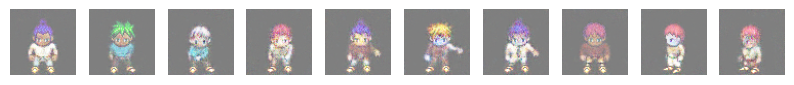

Epoch [28/50], Step [2915/2916], d_loss: 6.6679, g_loss: 0.0251


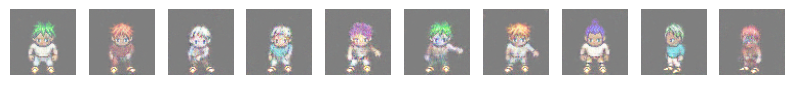

Epoch [29/50], Step [2915/2916], d_loss: 6.6598, g_loss: 0.0256


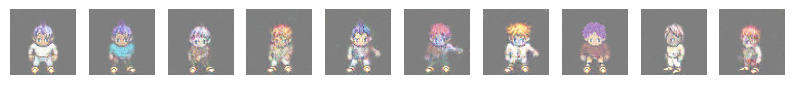

Epoch [30/50], Step [2915/2916], d_loss: 6.8975, g_loss: 0.0331


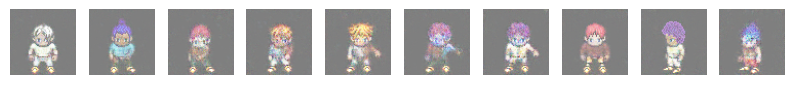

Epoch [31/50], Step [2915/2916], d_loss: 6.7508, g_loss: 0.0225


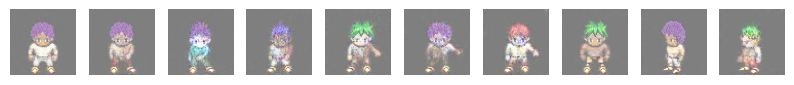

Epoch [32/50], Step [2915/2916], d_loss: 6.8685, g_loss: 0.0249


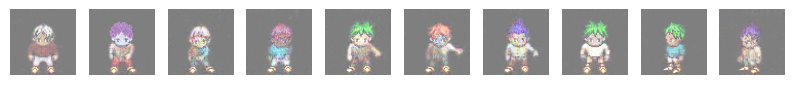

Epoch [33/50], Step [2915/2916], d_loss: 6.9762, g_loss: 0.0241


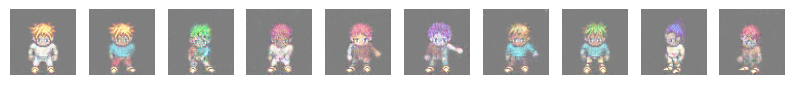

Epoch [34/50], Step [2915/2916], d_loss: 6.9447, g_loss: 0.0223


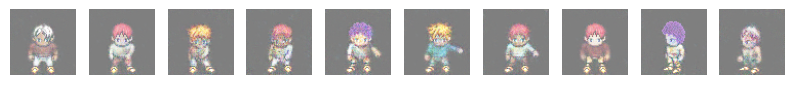

Epoch [35/50], Step [2915/2916], d_loss: 6.9495, g_loss: 0.0280


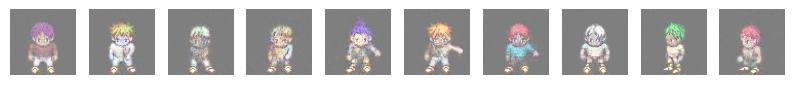

Epoch [36/50], Step [2915/2916], d_loss: 7.0443, g_loss: 0.0217


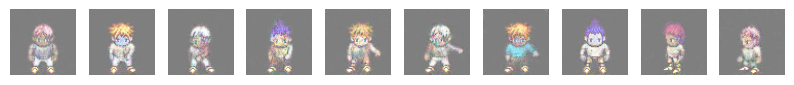

Epoch [37/50], Step [2915/2916], d_loss: 7.2514, g_loss: 0.0199


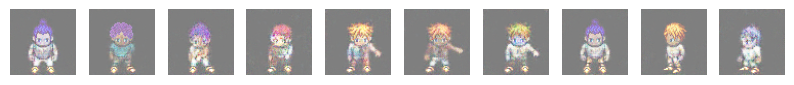

Epoch [38/50], Step [2915/2916], d_loss: 7.3365, g_loss: 0.0174


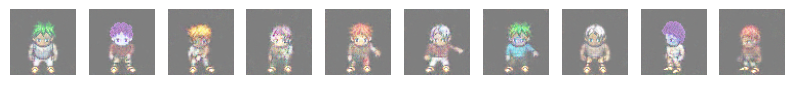

Epoch [39/50], Step [2915/2916], d_loss: 7.1953, g_loss: 0.0240


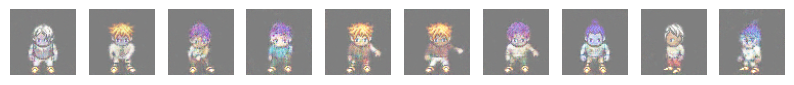

Epoch [40/50], Step [2915/2916], d_loss: 7.2028, g_loss: 0.0205


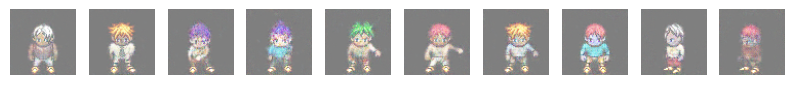

Epoch [41/50], Step [2915/2916], d_loss: 7.3038, g_loss: 0.0178


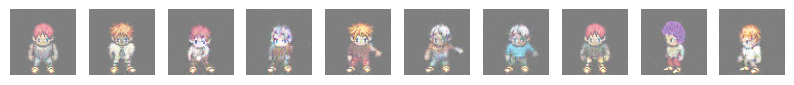

Epoch [42/50], Step [2915/2916], d_loss: 7.4221, g_loss: 0.0188


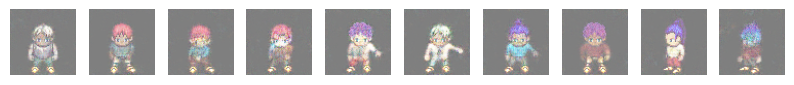

Epoch [43/50], Step [2915/2916], d_loss: 7.3297, g_loss: 0.0222


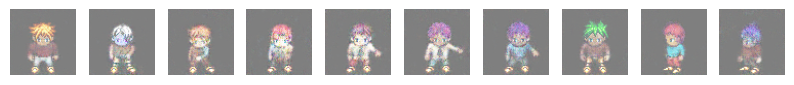

Epoch [44/50], Step [2915/2916], d_loss: 7.3667, g_loss: 0.0181


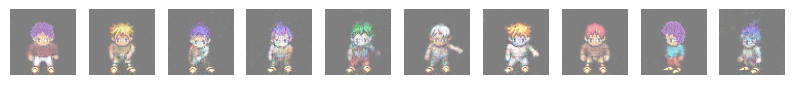

Epoch [45/50], Step [2915/2916], d_loss: 7.4954, g_loss: 0.0209


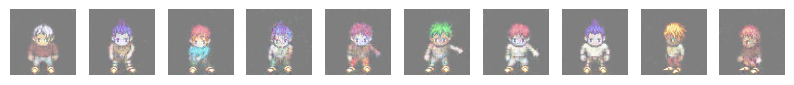

Epoch [46/50], Step [2915/2916], d_loss: 7.4530, g_loss: 0.0161


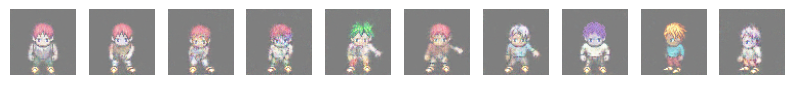

Epoch [47/50], Step [2915/2916], d_loss: 7.6400, g_loss: 0.0182


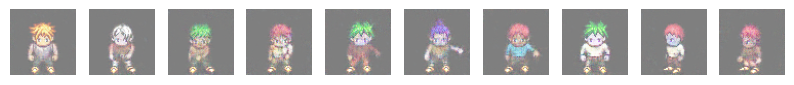

Epoch [48/50], Step [2915/2916], d_loss: 7.3965, g_loss: 0.0231


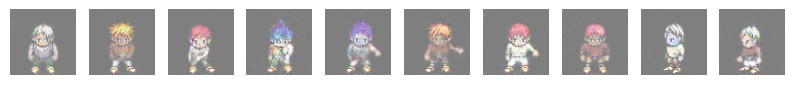

Epoch [49/50], Step [2915/2916], d_loss: 7.3117, g_loss: 0.0265


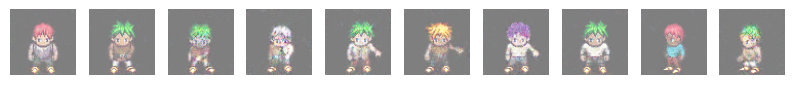

In [ ]:
# Bucle de entrenamiento
lista_g_loss_train = []
lista_d_loss_train = []
lista_g_loss_test = []
lista_d_loss_test = []

for epoch in range(epochs):
    total_d_loss_train = 0
    total_g_loss_train = 0
    total_d_loss_test = 0
    total_g_loss_test = 0
    for i, (images, labels) in enumerate(train_loader):
        batch_size = images.size(0)
        #real_labels = torch.ones(batch_size, 1).to(device)
        #fake_labels = torch.zeros(batch_size, 1).to(device)

        real_labels = torch.ones(batch_size, 1, 1, 1).to(device)  # Forma: [batch_size, 1, 1, 1]
        fake_labels = torch.zeros(batch_size, 1, 1, 1).to(device)  # Forma: [batch_size, 1, 1, 1]
        # Convertir imágenes y etiquetas a dispositivo
        images = images.to(device)
        labels = one_hot(labels, num_classes)

        # Entrenar el discriminador con imágenes reales
        optimizer_D.zero_grad()
        real_outputs = discriminatorDCGAN(images, labels)
        d_loss_real = criterionDCGAN(real_outputs, real_labels)

        # Entrenar el discriminador con imágenes falsas
        z = torch.randn(batch_size, latent_size).to(device)
        fake_images = generatorDCGAN(z, labels)
        fake_outputs = discriminatorDCGAN(fake_images.detach(), labels)
        d_loss_fake = criterionDCGAN(fake_outputs, fake_labels)

        # Pérdida total del discriminador
        d_loss = d_loss_real + d_loss_fake
        d_loss.backward()
        optimizer_D.step()

        # Entrenar el generador
        optimizer_G.zero_grad()
        fake_outputs = discriminatorDCGAN(fake_images, labels)
        g_loss = criterionDCGAN(fake_outputs, real_labels)
        g_loss.backward()
        optimizer_G.step()
        total_d_loss_train += d_loss.item()
        total_g_loss_train += g_loss.item()
    
    avg_d_loss_train = total_d_loss_train / len(train_loader)
    avg_g_loss_train = total_g_loss_train / len(train_loader)

    lista_d_loss_train.append(avg_d_loss_train)
    lista_g_loss_train.append(avg_g_loss_train)

    # Evaluación en el conjunto de prueba
    generatorDCGAN.eval()
    discriminatorDCGAN.eval()
    with torch.no_grad():
        for images, labels in test_loader:
            batch_size = images.size(0)

            real_labels = torch.ones(batch_size, 1, 1, 1).to(device)  # Forma: [batch_size, 1, 1, 1]
            fake_labels = torch.zeros(batch_size, 1, 1, 1).to(device)  # Forma: [batch_size, 1, 1, 1]
            # Convertir imágenes y etiquetas a dispositivo
            images = images.to(device)
            labels = one_hot(labels, num_classes)

            # Evaluar el discriminador con imágenes reales

            real_outputs = discriminatorDCGAN(images, labels)
            d_loss_real = criterionDCGAN(real_outputs, real_labels)

            # Evaluar el discriminador con imágenes falsas
            z = torch.randn(batch_size, latent_size).to(device)
            fake_images = generatorDCGAN(z, labels)
            fake_outputs = discriminatorDCGAN(fake_images, labels)
            d_loss_fake = criterionDCGAN(fake_outputs, fake_labels)

            # Pérdida total del discriminador
            d_loss = d_loss_real + d_loss_fake

            # Evaluar el generador
            g_loss = criterionDCGAN(fake_outputs, real_labels)

            total_d_loss_test += d_loss.item()
            total_g_loss_test += g_loss.item()
    
    avg_d_loss_test = total_d_loss_test / len(test_loader)
    avg_g_loss_test = total_g_loss_test / len(test_loader)

    lista_d_loss_test.append(avg_d_loss_test)
    lista_g_loss_test.append(avg_g_loss_test)

    print(f"Epoch [{epoch}/{epochs}], d_loss_train: {avg_d_loss_train:.4f}, g_loss_train: {avg_g_loss_train:.4f}, d_loss_test: {avg_d_loss_test:.4f}, g_loss_test: {avg_g_loss_test:.4f}")


    # Generar imágenes de muestra después de cada época
    with torch.no_grad():
        z = torch.randn(10, latent_size).to(device)
        c = torch.eye(num_classes, num_classes).to(device)[:10]
        sample_images = generatorDCGAN(z, c).cpu()
        fig, axes = plt.subplots(1, 10, figsize=(10, 1))
        for j in range(10):
            axes[j].imshow(sample_images[j].permute(1, 2, 0).numpy() * 0.5 + 0.5)  # Desnormalizar
            axes[j].axis("off")
        plt.show() 

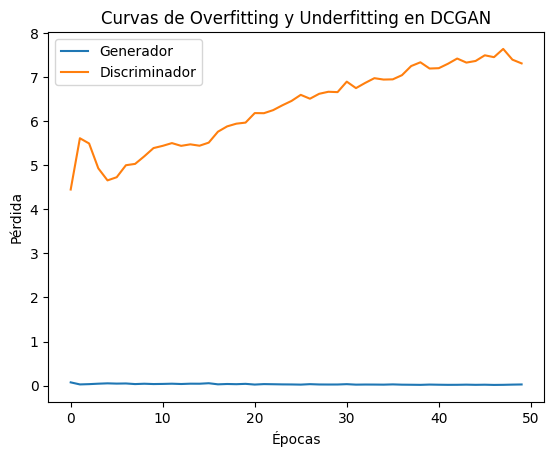

In [ ]:
# Graficar pérdidas

epochs_range = range(0, len(lista_g_loss_train))
plt.plot(epochs_range, lista_g_loss_train, label="Generador Entrenamiento")
plt.plot(epochs_range, lista_d_loss_train, label="Discriminador Entrenamiento")
plt.plot(epochs_range, lista_g_loss_test, label="Generador Test")
plt.plot(epochs_range, lista_d_loss_test, label="Discriminador Test")
plt.xlabel("Épocas")
plt.ylabel("Pérdida")
plt.legend()
plt.title("Curvas de Overfitting y Underfitting en DCGAN")
plt.show()

In [ ]:
import time


def sample_noise(batch_size, latent_dim):
    return torch.randn(batch_size, latent_dim, device=device)

def generate_images_DCGAN(model, num_samples=5, accion=None, perfil=None, movimiento=None):
    # Medir uso inicial de recursos
    start_time = time.time()
    initial_ram = psutil.virtual_memory().used / (1024 ** 2)  # RAM en MB
    initial_gpu = get_gpu_memory()  # VRAM en MB

    with torch.no_grad():
        # Crear ruido aleatorio
        test_noise = sample_noise(num_samples, latent_size)

        # Crear etiquetas condicionales
        if not None in [accion, perfil, movimiento]:
            perfil_grupo = ['front', 'left', 'right']
            accion_grupo = ['slash', 'spellcard', 'walk']
            perfiln = perfil_grupo.index(perfil)
            accionn = accion_grupo.index(accion)
            clases_list = [(accionn * 3 * 8) + (perfiln * 8) + movimiento for _ in range(num_samples)]
            clases = torch.tensor(clases_list, dtype=torch.long).to(device)
        else:
            clases = torch.randint(0, num_classes, (num_samples,), device=device)
        
        c = torch.zeros(num_samples, num_classes)
        c[range(num_samples), clases] = 1
        c = c.to(device)

        print(clases)
        generated_images = model(test_noise, c).cpu()  # Pasar el one-hot encoding al generador
        if device.type == 'cuda':
            vram_usage = cuda.memory_allocated(device) / (1024 ** 2)  # MB
            print(f"Consumo de VRAM: {vram_usage:.2f} MB")
        
        ram_usage = torch.cuda.memory_reserved(device) / (1024 ** 2)  # MB
        print(f"Consumo de RAM: {ram_usage:.2f} MB")

    # Medir uso final de recursos
    end_time = time.time()

    # Calcular métricas
    execution_time = (end_time - start_time) / num_samples

    print(f"Tiempo promedio por imagen: {execution_time:.4f} segundos")


    # Mostrar las imágenes con la clase
    fig, axes = plt.subplots(1, num_samples, figsize=(num_samples * 2, 2))
    for i in range(num_samples):
        img = generated_images[i].permute(1, 2, 0).numpy()  # Reordenar ejes
        img = (img - img.min()) / (img.max() - img.min())  # Normalizar a [0,1]
        axes[i].imshow(img)
        axes[i].axis('off')

    plt.show()

tensor([49, 71, 37,  9, 62], device='cuda:0')
Tiempo promedio por imagen: 0.0486 segundos
Uso de RAM: -3.13 MB
Uso de VRAM: -11.00 MB


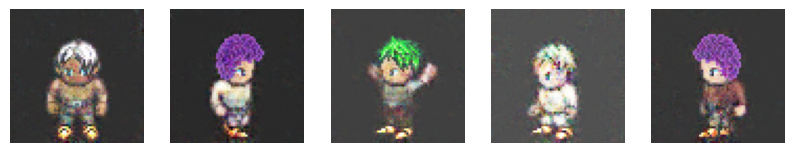

tensor([5, 5, 5, 5, 5], device='cuda:0')
Tiempo promedio por imagen: 0.0181 segundos
Uso de RAM: -0.81 MB
Uso de VRAM: 0.00 MB


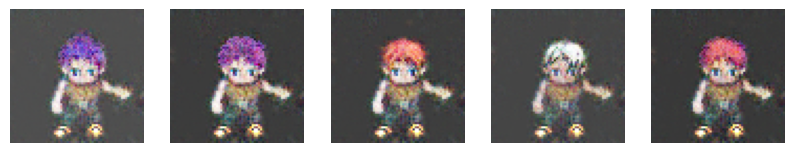

tensor([21, 21, 21, 21, 21], device='cuda:0')
Tiempo promedio por imagen: 0.0185 segundos
Uso de RAM: 1.32 MB
Uso de VRAM: 2.00 MB


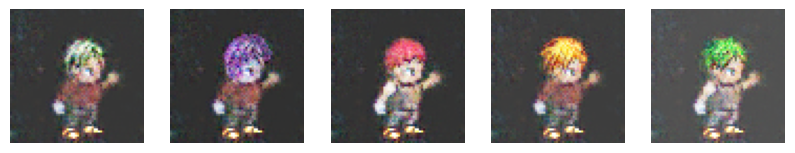

tensor([13, 13, 13, 13, 13], device='cuda:0')
Tiempo promedio por imagen: 0.0186 segundos
Uso de RAM: 1.16 MB
Uso de VRAM: 1.00 MB


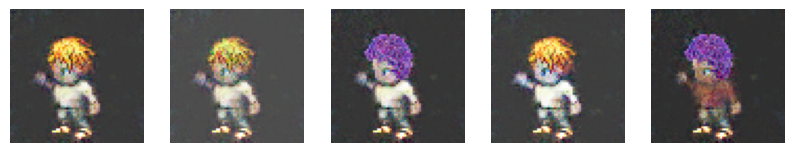

tensor([29, 29, 29, 29, 29], device='cuda:0')
Tiempo promedio por imagen: 0.0193 segundos
Uso de RAM: 0.04 MB
Uso de VRAM: 1.00 MB


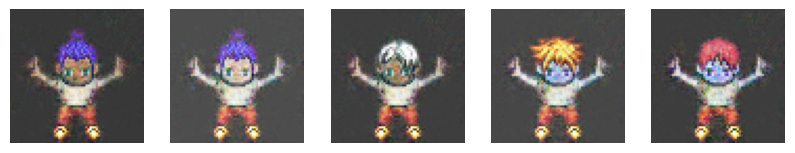

tensor([45, 45, 45, 45, 45], device='cuda:0')
Tiempo promedio por imagen: 0.0198 segundos
Uso de RAM: -0.71 MB
Uso de VRAM: 0.00 MB


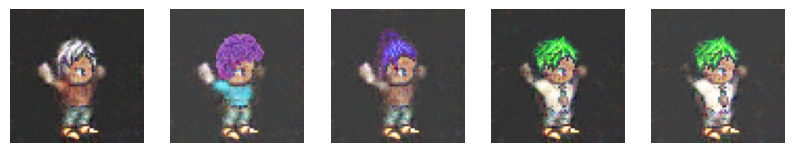

tensor([37, 37, 37, 37, 37], device='cuda:0')
Tiempo promedio por imagen: 0.0197 segundos
Uso de RAM: -1.62 MB
Uso de VRAM: -9.00 MB


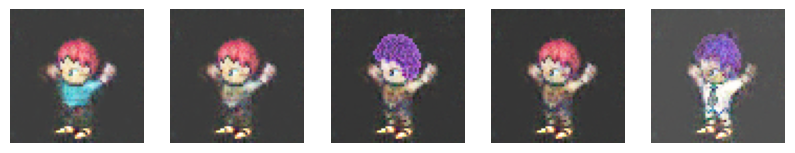

tensor([53, 53, 53, 53, 53], device='cuda:0')
Tiempo promedio por imagen: 0.0179 segundos
Uso de RAM: 0.17 MB
Uso de VRAM: 4.00 MB


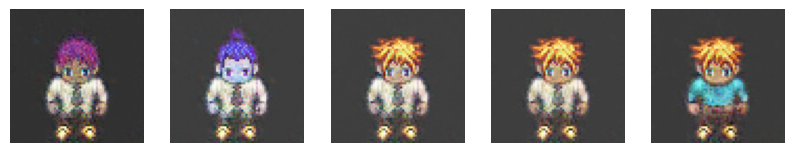

tensor([69, 69, 69, 69, 69], device='cuda:0')
Tiempo promedio por imagen: 0.0217 segundos
Uso de RAM: 0.00 MB
Uso de VRAM: 0.00 MB


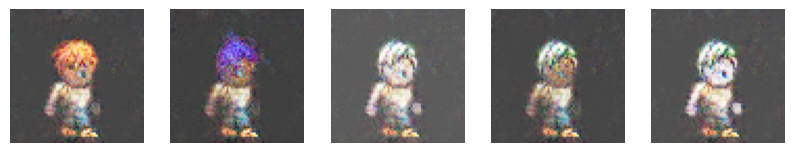

tensor([61, 61, 61, 61, 61], device='cuda:0')
Tiempo promedio por imagen: 0.0192 segundos
Uso de RAM: 0.45 MB
Uso de VRAM: 0.00 MB


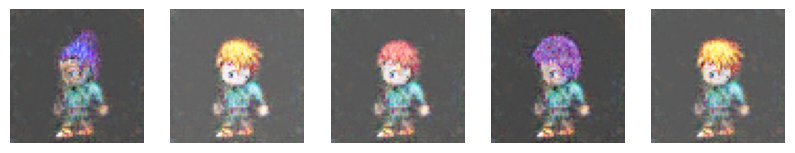

In [160]:
# Llamar a la función para generar imágenes
generate_images_DCGAN(generatorDCGAN, num_samples=5)
generate_images_DCGAN(generatorDCGAN, num_samples=5,perfil='front',accion='slash',movimiento=5)
generate_images_DCGAN(generatorDCGAN, num_samples=5,perfil='right',accion='slash',movimiento=5)
generate_images_DCGAN(generatorDCGAN, num_samples=5,perfil='left',accion='slash',movimiento=5)
generate_images_DCGAN(generatorDCGAN, num_samples=5,perfil='front',accion='spellcard',movimiento=5)
generate_images_DCGAN(generatorDCGAN, num_samples=5,perfil='right',accion='spellcard',movimiento=5)
generate_images_DCGAN(generatorDCGAN, num_samples=5,perfil='left',accion='spellcard',movimiento=5)
generate_images_DCGAN(generatorDCGAN, num_samples=5,perfil='front',accion='walk',movimiento=5)
generate_images_DCGAN(generatorDCGAN, num_samples=5,perfil='right',accion='walk',movimiento=5)
generate_images_DCGAN(generatorDCGAN, num_samples=5,perfil='left',accion='walk',movimiento=5)

creando figuras para 72


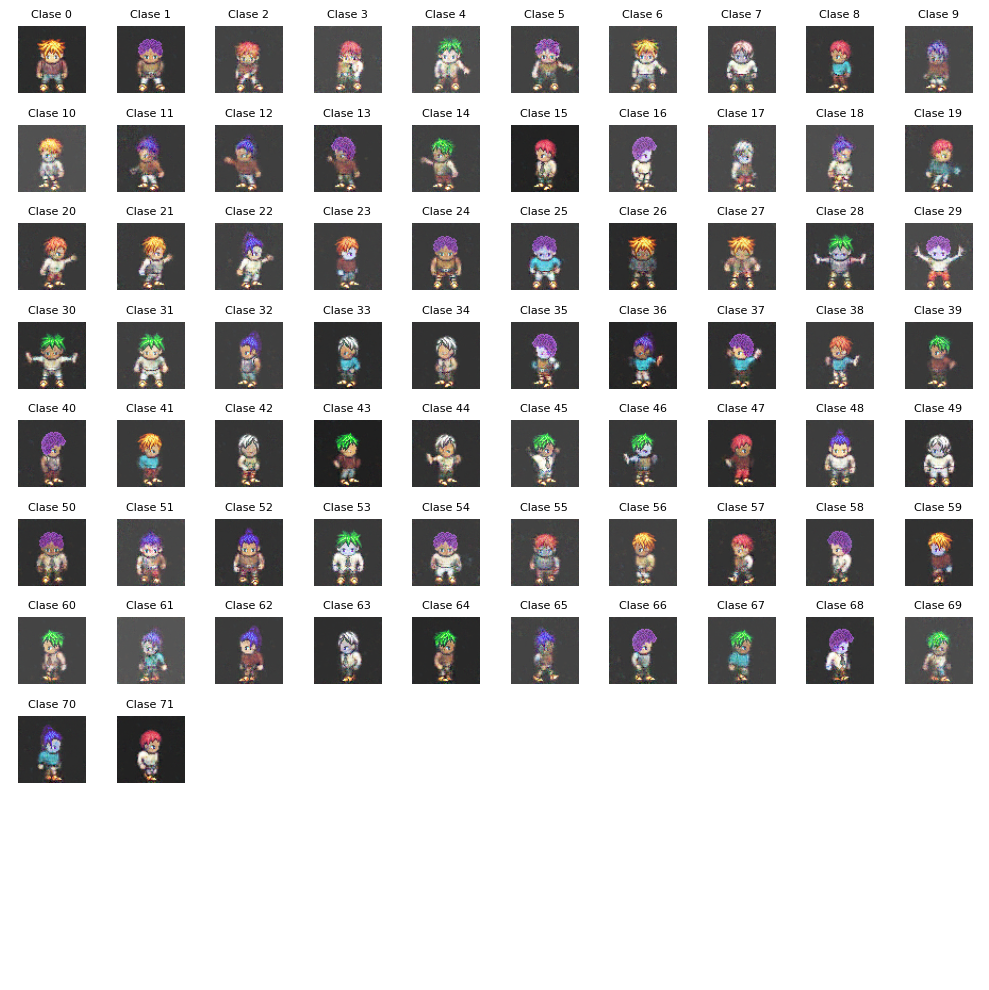

In [ ]:
import matplotlib.pyplot as plt
import torch
def sample_noise(batch_size, latent_dim):
    return torch.randn(batch_size, latent_dim, device=device)

def generate_images_for_all_classes(model, latent_size, num_classes, img_width, img_height):
    
    """
    Genera una imagen para cada clase y las muestra en una cuadrícula.
    
    Args:
        model (nn.Module): El generador del CGAN.
        latent_size (int): Dimensión del vector latente.
        num_classes (int): Número total de clases.
        img_width (int): Ancho de las imágenes generadas.
        img_height (int): Alto de las imágenes generadas.
    """

    model.eval()  # Poner el modelo en modo evaluación
    with torch.no_grad():
        # Crear un tensor de ruido fijo para todas las clases
        noise = sample_noise(num_classes, latent_size)
        
        # Crear un tensor de etiquetas one-hot para todas las clases
        labels = torch.eye(num_classes).to(device)  # One-hot encoding para todas las clases
        
        # Generar imágenes para todas las clases
        generated_images = model(noise, labels).cpu()
        
        # Mostrar las imágenes en una cuadrícula
        fig, axes = plt.subplots(
            nrows=int(num_classes**0.55),  # Número de filas
            ncols=int(num_classes**0.55),  # Número de columnas
            figsize=(10, 10)  # Tamaño de la figura
        )
        print("creando figuras para %s"%num_classes)
        for i, ax in enumerate(axes.flat):
            if i < num_classes:
                img = generated_images[i].permute(1, 2, 0).numpy()  # Reordenar ejes
                img = (img - img.min()) / (img.max() - img.min())  # Normalizar a [0,1]
                ax.imshow(img)
                ax.set_title(f"Clase {i}", fontsize=8)
            ax.axis('off')  # Ocultar ejes
        
        plt.tight_layout()
        plt.show()

# Llamar a la función para generar imágenes para todas las clases
generate_images_for_all_classes(generatorDCGAN, latent_size, num_classes, img_width, img_height)